# Catalyst Introduction

In [ ]:
using Pkg

# name of the environment 
Pkg.activate("/home/ianyang/stochastic_simulations/src/julia")

# packages we will use in this tutorial
Pkg.add("Catalyst")
Pkg.add("OrdinaryDiffEqTsit5")
Pkg.add("Plots")
Pkg.add("Latexify")
Pkg.add("JumpProcesses")
Pkg.add("StochasticDiffEq")

  Activating project at `~/stochastic_simulations/julia/catalyst_introduction`
    Updating registry at `~/.julia/registries/General.toml`
   Resolving package versions...
  No Changes to `~/stochastic_simulations/julia/catalyst_introduction/Project.toml`
  No Changes to `~/stochastic_simulations/julia/catalyst_introduction/Manifest.toml`
Precompiling project...
   8009.7 ms  ✓ OrdinaryDiffEqDifferentiation
   3970.5 ms  ✓ OrdinaryDiffEqDifferentiation → OrdinaryDiffEqDifferentiationSparseArraysExt
   5747.5 ms  ✓ OrdinaryDiffEqNonlinearSolve
   6895.9 ms  ✓ StochasticDiffEq
  4 dependencies successfully precompiled in 29 seconds. 432 already precompiled.
   Resolving package versions...
  No Changes to `~/stochastic_simulations/julia/catalyst_introduction/Project.toml`
  No Changes to `~/stochastic_simulations/julia/catalyst_introduction/Manifest.toml`
Precompiling project...
   7061.8 ms  ✓ OrdinaryDiffEqTsit5
  1 dependency successfully precompiled in 8 seconds. 435 already precompi

----


In [ ]:
using Pkg
# name of the environment (this will create a folder called catalyst_introduction in your current working directory if it doesn't already exist)
Pkg.activate("/home/ianyang/stochastic_simulations/src/julia")
using Catalyst, OrdinaryDiffEqTsit5, Plots, Latexify

  Activating project at `~/stochastic_simulations/julia/catalyst_introduction`
[ Info: Precompiling Catalyst [479239e8-5488-4da2-87a7-35f2df7eef83] (cache misses: wrong dep version loaded (2), incompatible header (2), dep missing source (2))
[ Info: Precompiling OrdinaryDiffEqTsit5 [b1df2697-797e-41e3-8120-5422d3b24e4a] (cache misses: wrong dep version loaded (4))
[ Info: Precompiling OrdinaryDiffEqCoreEnzymeCoreExt [ca1c724a-f4aa-55ef-b8e4-2f05449449ac] (cache misses: wrong dep version loaded (4))
[ Info: Precompiling Plots [91a5bcdd-55d7-5caf-9e0b-520d859cae80] (cache misses: wrong dep version loaded (6), incompatible header (2))
[ Info: Precompiling SpecialFunctionsExt [997ecda8-951a-5f50-90ea-61382e97704b] (cache misses: wrong dep version loaded (6), incompatible header (2))
[ Info: Precompiling UnitfulExt [0e51ec96-f580-5f12-a625-1297083d7970] (cache misses: wrong dep version loaded (6), incompatible header (2))
[ Info: Precompiling IJuliaExt [2f4121a4-3b3a-5ce6-9c5e-1f2673ce168a]

In [3]:
rn = @reaction_network Repressilator begin
    hillr(P₃,α,K,n), ∅ --> m₁
    hillr(P₁,α,K,n), ∅ --> m₂
    hillr(P₂,α,K,n), ∅ --> m₃
    (δ,γ), m₁ <--> ∅
    (δ,γ), m₂ <--> ∅
    (δ,γ), m₃ <--> ∅
    β, m₁ --> m₁ + P₁
    β, m₂ --> m₂ + P₂
    β, m₃ --> m₃ + P₃
    μ, P₁ --> ∅
    μ, P₂ --> ∅
    μ, P₃ --> ∅
end

Model Repressilator:
Unknowns (6): see unknowns(Repressilator)
  m₁(t)
  m₂(t)
  m₃(t)
  P₁(t)
  P₂(t)
  P₃(t)
Parameters (7): see parameters(Repressilator)
  α
  K
  n
  δ
  γ
  β
  ⋮

In [4]:
species(rn)

6-element Vector{SymbolicUtils.BasicSymbolic{Real}}:
 m₁(t)
 m₂(t)
 m₃(t)
 P₁(t)
 P₂(t)
 P₃(t)

In [5]:
parameters(rn)

7-element Vector{Any}:
 α
 K
 n
 δ
 γ
 β
 μ

In [6]:
reactions(rn)

15-element Vector{Reaction}:
 Catalyst.hillr(P₃(t), α, K, n), ∅ --> m₁
 Catalyst.hillr(P₁(t), α, K, n), ∅ --> m₂
 Catalyst.hillr(P₂(t), α, K, n), ∅ --> m₃
 δ, m₁ --> ∅
 γ, ∅ --> m₁
 δ, m₂ --> ∅
 γ, ∅ --> m₂
 δ, m₃ --> ∅
 γ, ∅ --> m₃
 β, m₁ --> m₁ + P₁
 β, m₂ --> m₂ + P₂
 β, m₃ --> m₃ + P₃
 μ, P₁ --> ∅
 μ, P₂ --> ∅
 μ, P₃ --> ∅

In [7]:
latexify(rn)

"\\begin{align*}\n\\varnothing &\\xrightarrow{\\frac{K^{n} \\alpha}{K^{n} + \\mathtt{P_3}^{n}}} \\mathrm{\\mathtt{m_1}} \\\\\n\\varnothing &\\xrightarrow{\\frac{K^{n} \\alpha}{\\mathtt{P_1}^{n} + K^{n}}} \\mathrm{\\mathtt{m_2}} \\\\\n\\varnothing &\\xrightarrow{\\frac{K^{n} \\alpha}{K^{n} + \\matht" ⋯ 447 bytes ⋯ "thrm{\\mathtt{m_3}} &\\xrightarrow{\\beta} \\mathrm{\\mathtt{m_3}} + \\mathrm{\\mathtt{P_3}} \\\\\n\\mathrm{\\mathtt{P_1}} &\\xrightarrow{\\mu} \\varnothing \\\\\n\\mathrm{\\mathtt{P_2}} &\\xrightarrow{\\mu} \\varnothing \\\\\n\\mathrm{\\mathtt{P_3}} &\\xrightarrow{\\mu} \\varnothing  \n \\end{align*}\n"

In [8]:
import Pkg; 
Pkg.add("CairoMakie")
Pkg.add("GraphMakie")
Pkg.add("NetworkLayout")

   Resolving package versions...
  No Changes to `~/stochastic_simulations/julia/catalyst_introduction/Project.toml`
  No Changes to `~/stochastic_simulations/julia/catalyst_introduction/Manifest.toml`
Precompiling project...
┌ Warning: attempting to remove probably stale pidfile
│   path = "/home/ianyang/.julia/compiled/v1.11/ImageCore/cqNLm_TdqnW.ji.pidfile"
└ @ FileWatching.Pidfile ~/.julia/juliaup/julia-1.11.7+0.x64.linux.gnu/share/julia/stdlib/v1.11/FileWatching/src/pidfile.jl:249
┌ Warning: attempting to remove probably stale pidfile
│   path = "/home/ianyang/.julia/compiled/v1.11/FFTW/PvIn2_TdqnW.ji.pidfile"
└ @ FileWatching.Pidfile ~/.julia/juliaup/julia-1.11.7+0.x64.linux.gnu/share/julia/stdlib/v1.11/FileWatching/src/pidfile.jl:249
   2035.5 ms  ✓ libwebp_jll
   3106.6 ms  ✓ OpenSSL
   3237.9 ms  ✓ Interpolations
   3362.1 ms  ✓ RecursiveArrayTools → RecursiveArrayToolsStructArraysExt
   3331.8 ms  ✓ RecursiveArrayTools → RecursiveArrayToolsTablesExt
   3958.9 ms  ✓ LevyArea
 

[ Info: Precompiling CairoMakie [13f3f980-e62b-5c42-98c6-ff1f3baf88f0] (cache misses: wrong dep version loaded (2))
[ Info: Precompiling GeometryBasicsExt [b238bd29-021f-5edc-8b0e-16b9cda5f63a] (cache misses: wrong dep version loaded (2))
[ Info: Precompiling RecursiveArrayToolsTablesExt [d7e6196c-66fc-58ad-a3da-7870e8770d21] (cache misses: wrong dep version loaded (2))
[ Info: Precompiling RecursiveArrayToolsStructArraysExt [07510ace-05c5-59ac-8535-cc0df8d4a157] (cache misses: wrong dep version loaded (2))
[ Info: Precompiling FileIOExt [f5f51d8f-5827-5d2e-939b-192fcd6ec70c] (cache misses: wrong dep version loaded (2))
[ Info: Precompiling IntervalArithmeticForwardDiffExt [ba47a815-ec9a-57c1-b718-e4e972ac9261] (cache misses: wrong dep version loaded (2))
[ Info: Precompiling SciMLBaseMakieExt [565f26a4-c902-5eae-92ad-e10714a9d9de] (cache misses: wrong dep version loaded (2))
[ Info: Precompiling DomainSetsMakieExt [da481366-01c8-5b4d-b359-47a10c8532e7] (cache misses: wrong dep version

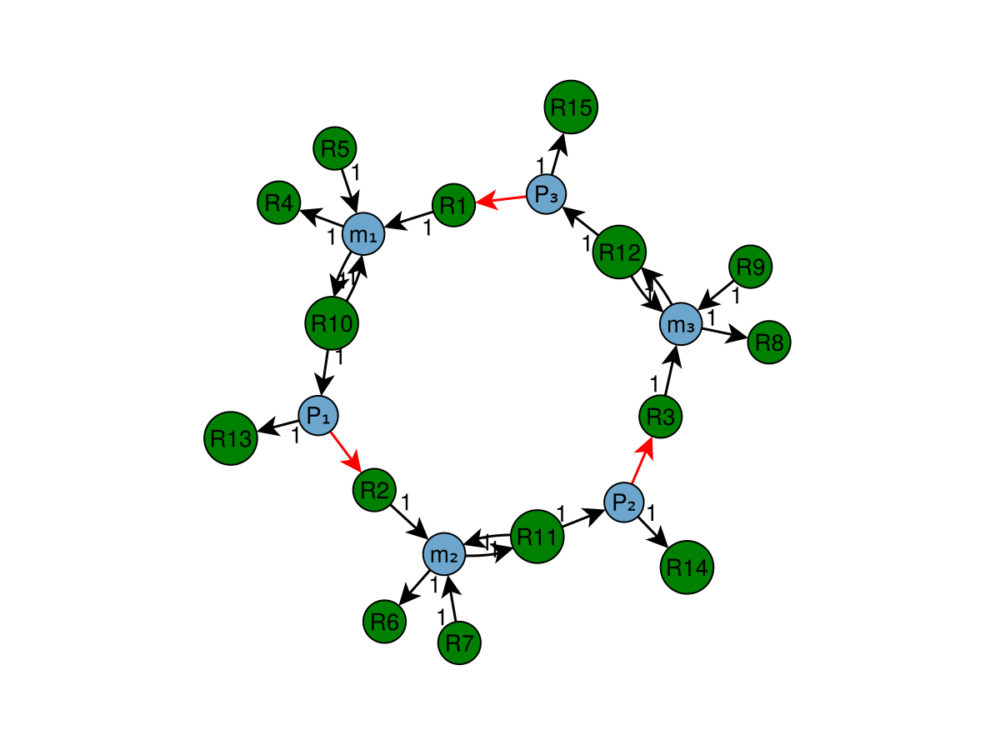

In [8]:
using Catalyst
import CairoMakie, GraphMakie, NetworkLayout
g = plot_network(rn)

In [11]:
GraphMakie.save("repressilator_graph.png", g)

In [12]:
odesys = convert(ODESystem, rn)

Model Repressilator:
Equations (6):
  6 standard: see equations(Repressilator)
Unknowns (6): see unknowns(Repressilator)
  m₁(t)
  m₂(t)
  m₃(t)
  P₁(t)
  P₂(t)
  P₃(t)
Parameters (7): see parameters(Repressilator)
  α
  K
  n
  δ
  γ
  β
  ⋮

In [13]:
# specify parameter values and initial conditions for the ODE system
pmap  = (:α => .5, :K => 40, :n => 2, :δ => log(2)/120,
         :γ => 5e-3, :β => log(2)/6, :μ => log(2)/60)
u₀map = [:m₁ => 0., :m₂ => 0., :m₃ => 0., :P₁ => 20., :P₂ => 0., :P₃ => 0.]

6-element Vector{Pair{Symbol, Float64}}:
 :m₁ => 0.0
 :m₂ => 0.0
 :m₃ => 0.0
 :P₁ => 20.0
 :P₂ => 0.0
 :P₃ => 0.0

In [14]:
# or use ModellingToolkit's symbolic variables
psymmap  = (rn.α => .5, rn.K => 40, rn.n => 2, rn.δ => log(2)/120,
    rn.γ => 5e-3, rn.β => 20*log(2)/120, rn.μ => log(2)/60)
u₀symmap = [rn.m₁ => 0., rn.m₂ => 0., rn.m₃ => 0., rn.P₁ => 20.,
    rn.P₂ => 0., rn.P₃ => 0.]

6-element Vector{Pair{Num, Float64}}:
 m₁(t) => 0.0
 m₂(t) => 0.0
 m₃(t) => 0.0
 P₁(t) => 20.0
 P₂(t) => 0.0
 P₃(t) => 0.0

In [15]:
# time interval to solve on
tspan = (0., 10000.)

# create the ODEProblem we want to solve
oprob = ODEProblem(rn, u₀map, tspan, pmap)

ODEProblem with uType Vector{Float64} and tType Float64. In-place: true
Initialization status: FULLY_DETERMINED
Non-trivial mass matrix: false
timespan: (0.0, 10000.0)
u0: 6-element Vector{Float64}:
  0.0
  0.0
  0.0
 20.0
  0.0
  0.0

In [16]:
odesys = complete(odesys)
oprob2 = ODEProblem(odesys, u₀map, tspan, pmap)

ODEProblem with uType Vector{Float64} and tType Float64. In-place: true
Initialization status: FULLY_DETERMINED
Non-trivial mass matrix: false
timespan: (0.0, 10000.0)
u0: 6-element Vector{Float64}:
  0.0
  0.0
  0.0
 20.0
  0.0
  0.0

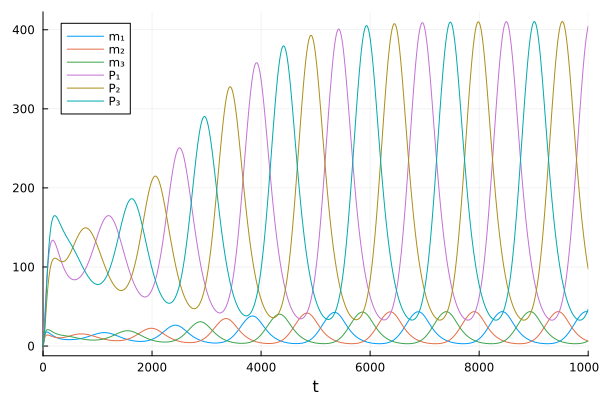

In [17]:
sol = solve(oprob, Tsit5(), saveat=10.0)
plot(sol)

## SSA 

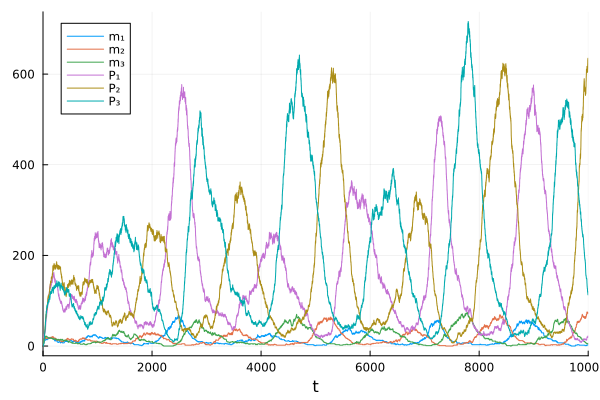

In [18]:
# imports the JumpProcesses packages
using JumpProcesses

# redefine the initial condition to be integer valued
u₀map = [:m₁ => 0, :m₂ => 0, :m₃ => 0, :P₁ => 20, :P₂ => 0, :P₃ => 0]

# next we process the inputs for the jump problem
jinputs = JumpInputs(rn, u₀map, tspan, pmap)

# now, we create a JumpProblem, and let a solver be chosen for us automatically
# in this case Gillespie's Direct Method will be selected
jprob = JumpProblem(jinputs)

# now, let's solve and plot the jump process:
sol = solve(jprob)
plot(sol)